In [1]:
#default_exp databunch

# DataBunch for Super Resolution

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
import os
import cv2
import numpy as np
import re
import random
from tqdm import tqdm
from matplotlib import pyplot as plt

In [4]:
#export
import PIL
from pathlib import PosixPath

In [5]:
#export
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
#from fastai.metrics import psnr

In [6]:
#hide
from nbdev.showdoc import *

In [7]:
#export
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

In [8]:
import sys
sys.path.append('..')
from superres.datasets import *
from superres.srcnn import *
#from psnr.psnr import *

In [9]:
seed = 8610
random.seed(seed)
np.random.seed(seed)

## after_open function of ImageImageList

In [10]:
#export
def resize_image(img:PIL.Image, size:int)->PIL.Image:
    """ resize PIL-image """
    w, h = img.size
    if w == size and h == size: return img
    else: return img.resize((size, size), PIL.Image.BICUBIC)

ImageImageList (14 items)
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
Path: /home/jovyan/notebook/datasets/Set14/HR


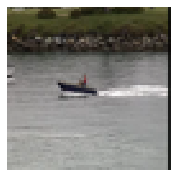

In [ ]:
il = ImageImageList.from_folder(set14_hr, after_open=partial(resize_image, size=64))
print(il)
il[0].show()

In [ ]:
#export
def lr_image(img:PIL.Image, scale:int, sizeup:bool=False, size:int=None)->PIL.Image:
    """ 
    create low resolution image.  
    sizeup=False : size=original_size // scale  
    sizeup=True and size=size: upsize to size.  
    sizeup=True and size=None: upsize to original size.  
    """
    w, h = img.size
    img = img.resize((w // scale, h // scale), PIL.Image.BICUBIC)
    if sizeup:
        img = img.resize((size, size), PIL.Image.BICUBIC) if size else img.resize((w, h), PIL.Image.BICUBIC)
    return img

ImageImageList (14 items)
Image (3, 72, 88),Image (3, 69, 69),Image (3, 97, 146),Image (3, 128, 128),Image (3, 128, 128)
Path: /home/jovyan/notebook/datasets/Set14/HR


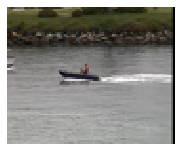

In [ ]:
# scale=4
il = ImageImageList.from_folder(set14_hr, after_open=partial(lr_image, scale=4))
print(il)
il[0].show()

ImageImageList (14 items)
Image (3, 288, 352),Image (3, 276, 276),Image (3, 391, 586),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/jovyan/notebook/datasets/Set14/HR


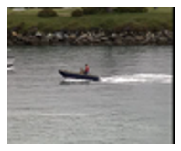

In [ ]:
# scale=4, resize=True
il = ImageImageList.from_folder(set14_hr, after_open=partial(lr_image, scale=4, sizeup=True))
print(il)
il[0].show()

ImageImageList (14 items)
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/Set14/HR


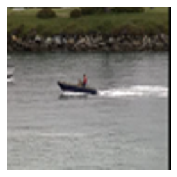

In [ ]:
# scale=4, resize=True, size=256
il = ImageImageList.from_folder(set14_hr, after_open=partial(lr_image, scale=4, sizeup=True, size=256))
print(il)
il[0].show()

In [ ]:
#export
def crop_center_image(img:PIL.Image, size:int)->PIL.Image:
    """ crop center PIL-image """
    w, h = img.size
    if size == w and size == h:
        return img
    else:
        return img.crop(((w - size) // 2,(h - size) // 2, (w + size) // 2, (h + size) // 2))    

ImageImageList (14 items)
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/Set14/HR


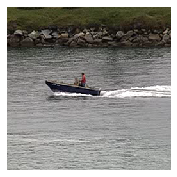

In [ ]:
il = ImageImageList.from_folder(set14_hr, after_open=partial(crop_center_image, size=256))
print(il)
il[0].show()

In [ ]:
#export
def split_luminance(img:PIL.Image)->PIL.Image:
    """ Y channel of YCbCr-Image """
    img, _, _ = img.split()
    return img

ImageImageList (14 items)
Image (1, 288, 352),Image (1, 276, 276),Image (1, 391, 586),Image (1, 512, 512),Image (1, 512, 512)
Path: /home/jovyan/notebook/datasets/Set14/HR


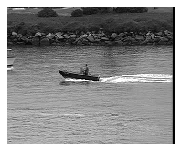

In [ ]:
il = ImageImageList.from_folder(set14_hr, convert_mode='YCbCr', after_open=split_luminance)
print(il)
il[0].show(cmap='gray')

In [ ]:
#export
def after_open_image(img:PIL.Image, size, scale:int=1, sizeup:bool=False, crop:bool=True, luminance:bool=False)->PIL.Image:
    """ after_open function of ImageImageList """
    w, h = img.size
    if scale > 1: img = lr_image(img, scale, sizeup=sizeup)
    if crop: img = crop_center_image(img, size)
    if luminance: img = split_luminance(img)
    return img

ImageImageList (14 items)
Image (3, 288, 352),Image (3, 276, 276),Image (3, 391, 586),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/jovyan/notebook/datasets/Set14/HR


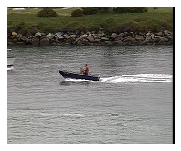

In [ ]:
# Original
il = ImageImageList.from_folder(set14_hr)
print(il)
il[0].show()

ImageImageList (14 items)
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/Set14/HR


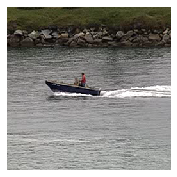

In [ ]:
# y when testing:
il = ImageImageList.from_folder(set14_hr, after_open=partial(after_open_image, size=256))
print(il)
il[0].show()

ImageImageList (14 items)
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/Set14/HR


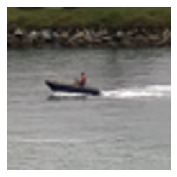

In [ ]:
# x when training: if x.shape == y.shape
il = ImageImageList.from_folder(set14_hr, after_open=partial(after_open_image, size=256, scale=4, sizeup=True))
print(il)
il[0].show()

ImageImageList (14 items)
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
Path: /home/jovyan/notebook/datasets/Set14/HR


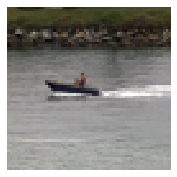

In [ ]:
# x when training: if x.shape == y.shape // scale
il = ImageImageList.from_folder(set14_hr, after_open=partial(after_open_image, size=64, scale=4))
print(il)
il[0].show()

ImageImageList (14 items)
Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256)
Path: /home/jovyan/notebook/datasets/Set14/HR


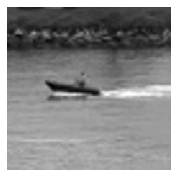

In [ ]:
# x when training: if x.shape == y.shape and channel is luminance only
il = ImageImageList.from_folder(set14_hr, after_open=partial(after_open_image, size=256, scale=4, sizeup=True, luminance=True))
print(il)
il[0].show(cmap='gray')

## Transform

In [ ]:
doc(get_transforms)

get_transforms [source] [test] get_transforms ( do_flip : bool = True , flip_vert : bool = False , max_rotate : float = 10.0 , max_zoom : float = 1.1 , max_lighting : float = 0.2 , max_warp : float = 0.2 , p_affine : float = 0.75 , p_lighting : float = 0.75 , xtra_tfms : Optional [ Collection [ Transform ]]= None ) → Collection [ Transform ] 
 
 × Tests found for get_transforms : pytest -sv tests/test_vision_data.py::test_image_to_image_different_tfms [source] pytest -sv tests/test_vision_data.py::test_image_to_image_different_y_size [source] To run tests please refer to this guide . Utility func to easily create a list of flip, rotate, zoom , warp, lighting transforms. 
 Show in docs

In [ ]:
#export
def get_sr_transforms(size, max_lighting:float=0.2, p_lighting:float=0.75, xtra_tfms:Optional[Collection[Transform]]=None)->'Collection[Transform]':
    """ trainsorms for super-resolution """
    res = [crop(size=size)]
    if max_lighting:
        res.append(brightness(change=(0.5*(1-max_lighting), 0.5*(1+max_lighting)), p=p_lighting))
        res.append(contrast(scale=(1-max_lighting, 1/(1-max_lighting)), p=p_lighting))
    #       train                   , valid
    return (res + listify(xtra_tfms), [crop(size=size)])

In [ ]:
get_sr_transforms(size=256)

([RandTransform(tfm=TfmPixel (crop), kwargs={'size': 256}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmLighting (brightness), kwargs={'change': (0.4, 0.6)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmLighting (contrast), kwargs={'scale': (0.8, 1.25)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True)],
 [RandTransform(tfm=TfmPixel (crop), kwargs={'size': 256}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True)])

ImageImageList (14 items)
Image (3, 288, 352),Image (3, 276, 276),Image (3, 391, 586),Image (3, 512, 512),Image (3, 512, 512)
Path: /home/jovyan/notebook/datasets/Set14/HR


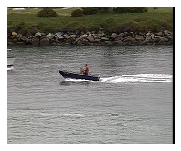

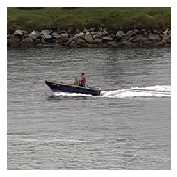

In [ ]:
tfms = get_sr_transforms(256)
il = ImageImageList.from_folder(set14_hr)
print(il)
img = il[0]
img.show()
img.apply_tfms(tfms[0]).show()

## DataBunch

In [ ]:
#export
def create_sr_databunch(data_path:PosixPath, in_size:int, out_size:int, scale:int, bs:int, convert_mode:str='RGB', seed:int=1234)->'DataBunch':
    """ create databunch for super-resolution """
    luminance = convert_mode == 'YCbCr'
    sizeup = in_size == out_size
    
    src = (ImageImageList.from_folder(data_path, convert_mode=convert_mode,
                                      after_open=partial(after_open_image, size=in_size, scale=scale, sizeup=sizeup, luminance=luminance))
        .split_by_rand_pct(seed=seed)
        .label_from_func((lambda x: x), label_cls=ImageImageList, convert_mode=convert_mode,
                         after_open=partial(after_open_image, size=out_size, luminance=luminance)))
    
    data = (src.transform(get_sr_transforms(size=in_size), tfm_y=True)
        .transform_y(get_sr_transforms(size=out_size, max_lighting=0))
        .databunch(path=Path('.'), bs=bs))
    if luminance:
        data.normalize(do_y=True)
    else:
        data.normalize(imagenet_stats, do_y=True)
    return data

ImageDataBunch;

Train: LabelList (25245 items)
x: ImageImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
y: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Valid: LabelList (6311 items)
x: ImageImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
y: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Test: None


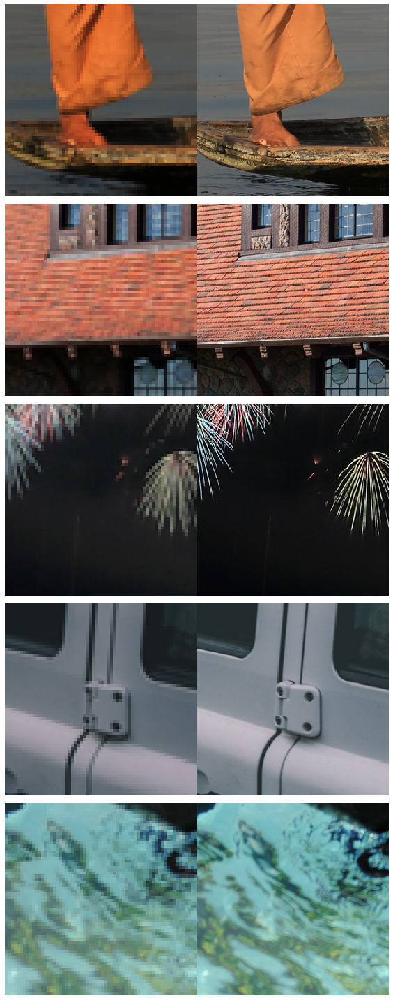

In [ ]:
# in_size=64, out_size=256
data = create_sr_databunch(div2k_train_hr_crop_256, in_size=64, out_size=256, scale=4, bs=10, seed=8610)
print(data)
data.show_batch()

ImageDataBunch;

Train: LabelList (25245 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Valid: LabelList (6311 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Test: None


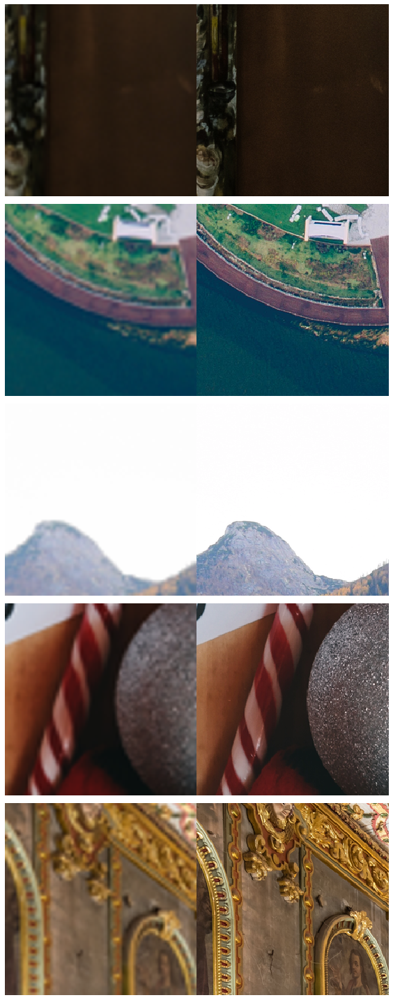

In [ ]:
# in_size=256, out_size=256
data = create_sr_databunch(div2k_train_hr_crop_256, in_size=256, out_size=256, scale=4, bs=10, seed=8610)
print(data)
data.show_batch()

ImageDataBunch;

Train: LabelList (25245 items)
x: ImageImageList
Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256)
y: ImageImageList
Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Valid: LabelList (6311 items)
x: ImageImageList
Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256)
y: ImageImageList
Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Test: None


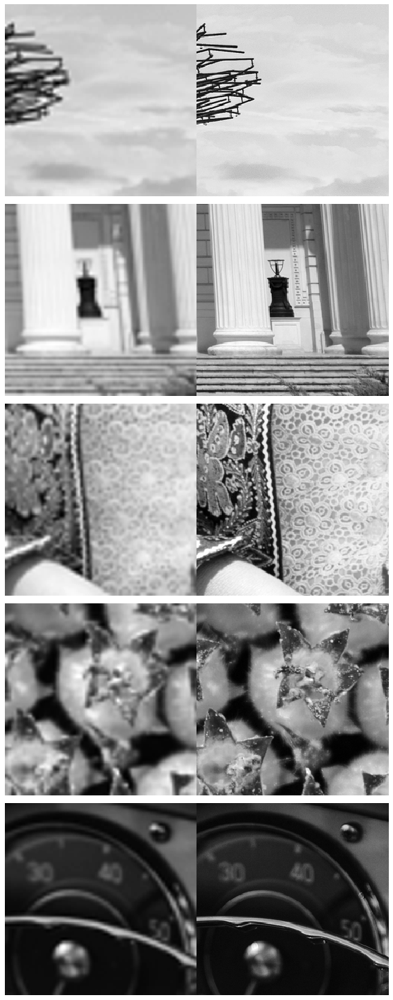

In [ ]:
# in_size=256, out_size=256, luminance only
data = create_sr_databunch(div2k_train_hr_crop_256, in_size=256, out_size=256, scale=4, bs=10, convert_mode='YCbCr', seed=8610)
print(data)
data.show_batch(cmap='gray')

### Why I don't use imagenet_stats when luminance-only.

In [ ]:
def create_imagenet_databunch(data_path:PosixPath, in_size:int, out_size:int, scale:int, bs:int, convert_mode:str='RGB', seed:int=1234)->'DataBunch':
    """ create databunch for super-resolution """
    luminance = convert_mode == 'YCbCr'
    sizeup = in_size == out_size
    
    src = (ImageImageList.from_folder(data_path, convert_mode=convert_mode,
                                      after_open=partial(after_open_image, size=in_size, scale=scale, sizeup=sizeup, luminance=luminance))
        .split_by_rand_pct(seed=seed)
        .label_from_func((lambda x: x), label_cls=ImageImageList, convert_mode=convert_mode,
                         after_open=partial(after_open_image, size=out_size, luminance=luminance)))
    
    data = (src.transform(get_sr_transforms(size=in_size), tfm_y=True)
        .transform_y(get_sr_transforms(size=out_size, max_lighting=0))
        .databunch(path=Path('.'), bs=bs))
    # set imagenet_status
    data.normalize(imagenet_stats, do_y=True)
    return data

In [ ]:
data = create_imagenet_databunch(div2k_train_hr_crop_256, in_size=256, out_size=256, scale=4, bs=10, convert_mode='YCbCr', seed=8610)

In [ ]:
# get one_batch
x, y = data.one_batch()

In [ ]:
# the channel is 3 instead of 1.
x.shape

torch.Size([10, 3, 256, 256])

In [ ]:
# the channel is 3 instead of 1.
x, y = next(iter(data.train_dl))
x.shape

torch.Size([10, 3, 256, 256])

In [ ]:
# the shape of data.x is correct.
print(data.x)
data.x[0].shape

ImageImageList (25245 items)
Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256),Image (1, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256


torch.Size([1, 256, 256])

In [ ]:
# the shape of data.x is correct.
print(data.train_ds[0])
x, y = data.train_ds[0]
x.shape

(Image (1, 256, 256), Image (1, 256, 256))


torch.Size([1, 256, 256])

In [ ]:
# train_dl class is ...
type(data.train_dl)

fastai.basic_data.DeviceDataLoader

```python
class DeviceDataLoader():
    def __iter__(self):
        "Process and returns items from `DataLoader`."
        for b in self.dl: yield self.proc_batch(b)
```

In [ ]:
# the shape of train_dl.dl(Pytorch class) is correct.
x, y = next(iter(data.train_dl.dl))
x.shape

torch.Size([10, 1, 256, 256])

In [ ]:
# The shape changes when you call DeviceDataLoader.proc_batch()
b = next(iter(data.train_dl.dl))
x, y = data.train_dl.proc_batch(b)
x.shape

torch.Size([10, 3, 256, 256])

```python
class DeviceDataLoader():
    def proc_batch(self,b:Tensor)->Tensor:
        "Process batch `b` of `TensorImage`."
        b = to_device(b, self.device)
        for f in listify(self.tfms): b = f(b)
        return b
```

In [ ]:
# The shape is changed in _normalize_batch
data.train_dl.tfms

[functools.partial(<function _normalize_batch at 0x7fd9c69687b8>, mean=tensor([0.4850, 0.4560, 0.4060]), std=tensor([0.2290, 0.2240, 0.2250]), do_x=True, do_y=True)]

fastai.vidion.data.py

```python
def normalize(x:TensorImage, mean:FloatTensor,std:FloatTensor)->TensorImage:
    "Normalize `x` with `mean` and `std`."
    return (x-mean[...,None,None]) / std[...,None,None]

def _normalize_batch(b:Tuple[Tensor,Tensor], mean:FloatTensor, std:FloatTensor, do_x:bool=True, do_y:bool=False)->Tuple[Tensor,Tensor]:
    "`b` = `x`,`y` - normalize `x` array of imgs and `do_y` optionally `y`."
    x,y = b
    mean,std = mean.to(x.device),std.to(x.device)
    if do_x: x = normalize(x,mean,std)
    if do_y and len(y.shape) == 4: y = normalize(y,mean,std)
    return x,y
```

The shape changed because .normalize(imagenet_stats) was specified when creating a DataBunch.
So I don't specify imagenet_stats for 1 channel-image.

## Metrix

In [ ]:
#export
def extract_y(img:Tensor)->'Tensor':
    """ extract luminance. img is RGB, input range is [0...1], output range is [0..255] """
    # return  img[0] * 65.481 / 255 + img[1] * 128.553 / 255 + img[2] * 24.966 /255 + 16
    return  img[0] * 65.481 + img[1] * 128.553 + img[2] * 24.966 + 16

In [ ]:
#export
imagenet_mean, imagenet_std = vision.data.imagenet_stats

def denorm_img(x:Tensor)->'Tensor':
    """ de normalize image """
    img = vision.data.denormalize(x, tensor(imagenet_mean), tensor(imagenet_std))
    img = img.clamp(min=0, max=1)
    #img = img.permute(1,2,0).numpy() * 255
    img = img.permute(1,2,0).numpy()
    img = extract_y(img)
    return img

In [ ]:
#export
def m_psnr(img1:Tensor, img2:Tensor)->'Tensor':
    """ metrics: peak_signal_noise_ratio """
    # n, c, h, w = img1.shape
    psnrs = []
    for i1, i2 in zip(img1, img2):
        psnrs.append(peak_signal_noise_ratio(denorm_img(i1), denorm_img(i2), data_range=255))
    return tensor(sum(psnrs) / len(psnrs)) # mean

In [ ]:
#export
def m_ssim(img1, img2)->'Tensor':
    """ metrics: structural_similarity """
    # n, c, h, w = img1.shape
    ssims = []
    for i1, i2 in zip(img1, img2):
        ssims.append(structural_similarity(denorm_img(i1), denorm_img(i2), multichannel=True))
        #ssims.append(structural_similarity(denorm_img(i1), denorm_img(i2)))
    return tensor(sum(ssims) / len(ssims)) # mean

## Training

In [ ]:
train_hr = div2k_train_hr_crop_256

In [ ]:
in_size = 256
out_size = 256
scale = 4
bs = 10

ImageDataBunch;

Train: LabelList (25245 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Valid: LabelList (6311 items)
x: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: ImageImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
Path: /home/jovyan/notebook/datasets/DIV2K/DIV2K_train_HR_crop/256;

Test: None


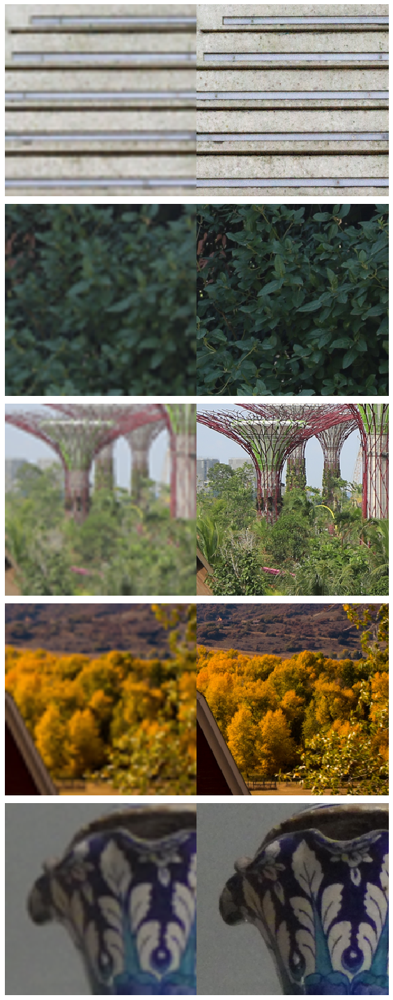

In [ ]:
data = create_sr_databunch(train_hr, in_size=in_size, out_size=out_size, scale=scale, bs=bs, seed=seed)
print(data)
data.show_batch()

Image super-resolution using deep convolutional networks

https://arxiv.org/abs/1501.00092

31 Dec 2014

In [ ]:
model = SRCNN()
loss_func = MSELossFlat()
metrics = [m_psnr]
learn = Learner(data, model, loss_func=loss_func, metrics=metrics)
learn.path = Path('.')
model_name = model.__class__.__name__

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 8.32E-04
Min loss divided by 10: 2.29E-03


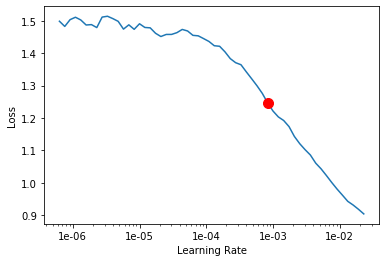

In [ ]:
lr_find(learn)
learn.recorder.plot(suggestion=True)

In [ ]:
lr = 1e-3
lrs = slice(lr)
epoch = 3
pct_start = 0.3
wd = 1e-3
save_fname = model_name

In [ ]:
callbacks = [ShowGraph(learn), SaveModelCallback(learn, name=save_fname)]

epoch,train_loss,valid_loss,m_psnr,time
0,0.111328,0.073401,28.265835,01:34
1,0.096555,0.063644,30.407476,01:34
2,0.094229,0.059933,31.025671,01:28


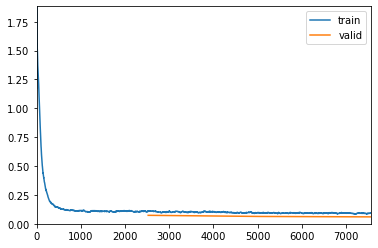

Better model found at epoch 0 with valid_loss value: 0.07340064644813538.
Better model found at epoch 1 with valid_loss value: 0.06364426016807556.
Better model found at epoch 2 with valid_loss value: 0.059933461248874664.


In [ ]:
learn.fit_one_cycle(epoch, lrs, pct_start=pct_start, wd=wd, callbacks=callbacks)

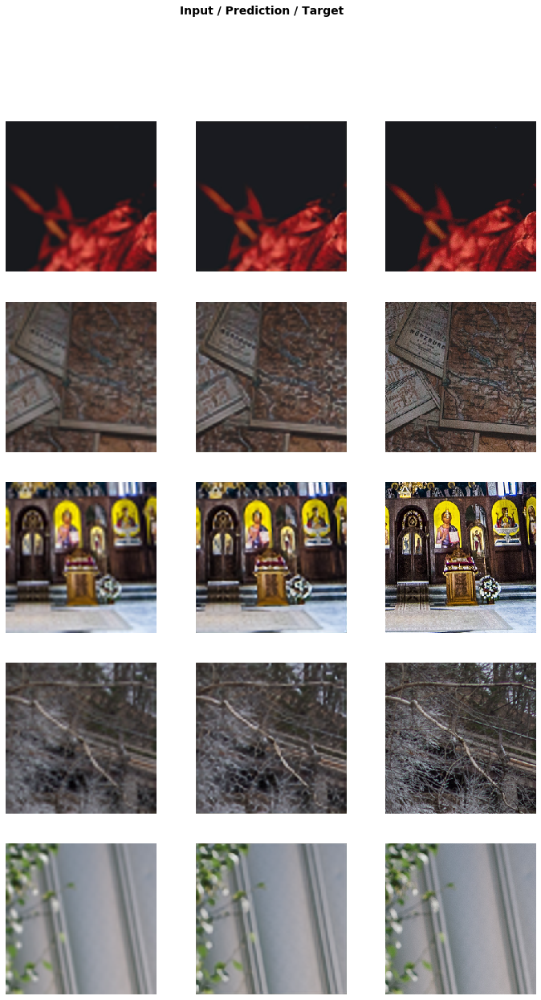

In [ ]:
learn.show_results()

## Test

In [ ]:
test_hr = set14_hr

In [ ]:
il_test_x = ImageImageList.from_folder(test_hr, after_open=partial(after_open_image, scale=4, sizeup=True, size=out_size))
il_test_y = ImageImageList.from_folder(test_hr, after_open=partial(after_open_image, size=out_size))

In [ ]:
# export
def reconstruct_image(t:Tensor)->"Image":
    """ create Image from Tensor """
    return Image(t.float().clamp(min=0, max=1))

In [ ]:
# export
def sr_predict(learn:Learner, item:ItemBase)->"ItemBase":
    """ predict for super-resolution """
    batch = learn.data.one_item(item)
    res = learn.pred_batch(batch=batch)
    raw_pred = grab_idx(res, 0)
    raw_pred = learn.data.denorm(raw_pred)
    pred = reconstruct_image(raw_pred)
    return pred

In [ ]:
# export
def get_metrics(img1:Tensor, img2:Tensor)->'[int, int]':
    """ psnr and ssim """
    #img1_y = extract_y(img1)
    #img2_y = extract_y(img2)
    psnr = peak_signal_noise_ratio(img1, img2)
    ssim = structural_similarity(img1, img2, multichannel=True)
    return [psnr, ssim]

In [ ]:
# export
def fmt_metrics(metrics):
    """ format of metrics """
    return f'PSNR:{metrics[0]:.2f},SSIM:{metrics[1]:.4f}'

In [ ]:
# export
def mean_metrics(metrics):
    """ mean of metrics """
    return np.asarray(metrics).mean(axis=0)

In [ ]:
#export
def sr_test(learn:Learner, il_test_x:ImageImageList, il_test_y:ImageImageList, model_name:str, cmap:str=None):
    """ test for super-resolution """
    pred_metrics = []
    bicubic_metrics = []
    for x, y in zip(il_test_x, il_test_y):
        pred = sr_predict(learn, x)
        pred_metrics.append(get_metrics(image2np(y.px), image2np(pred.px)))
        bicubic_metrics.append(get_metrics(image2np(y.px), image2np(x.px)))
        fig, axs = plt.subplots(1, 3, figsize=(15, 15))
        x.show(ax=axs[0], title=f'bicubic({fmt_metrics(bicubic_metrics[-1])})', cmap=cmap)
        pred.show(ax=axs[1], title=f'{model_name}({fmt_metrics(pred_metrics[-1])})', cmap=cmap)
        y.show(ax=axs[2], title='Ground Truth', cmap=cmap)
    print('bicubic:', fmt_metrics(mean_metrics(bicubic_metrics)))
    print(f'{model_name}:\t', fmt_metrics(mean_metrics(pred_metrics)))

In [ ]:
_ = learn.load(save_fname)

bicubic: PSNR:24.11,SSIM:0.7822
SRCNN:	 PSNR:24.68,SSIM:0.8057


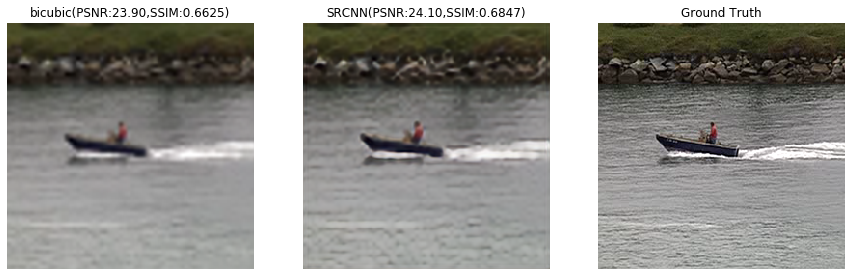

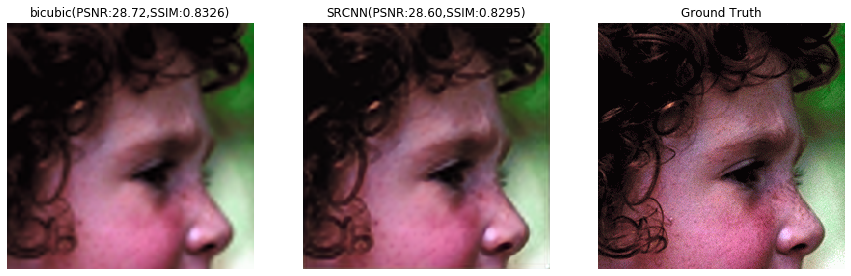

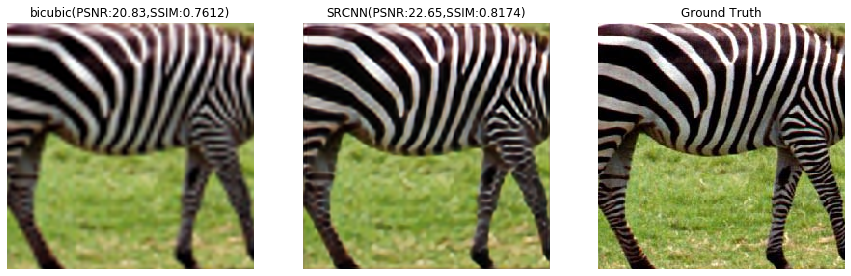

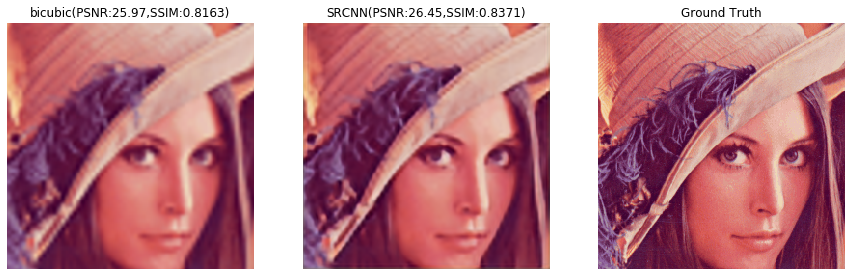

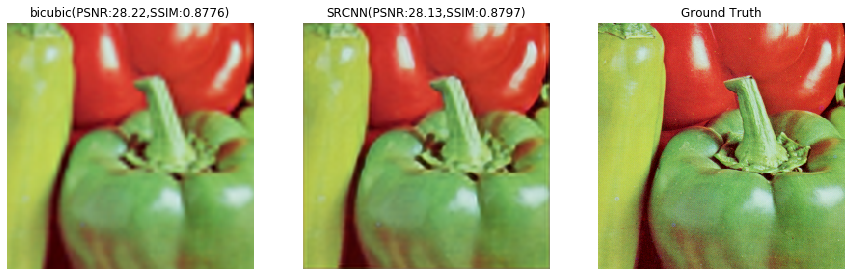

...

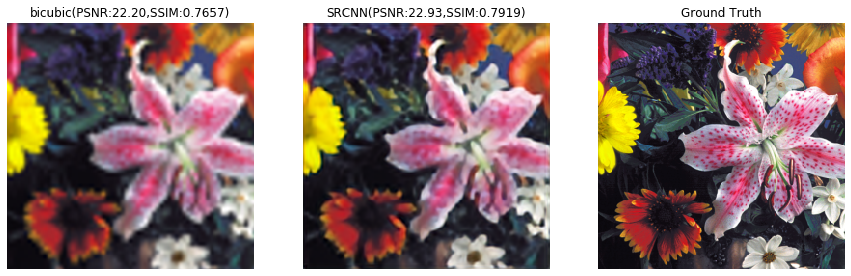

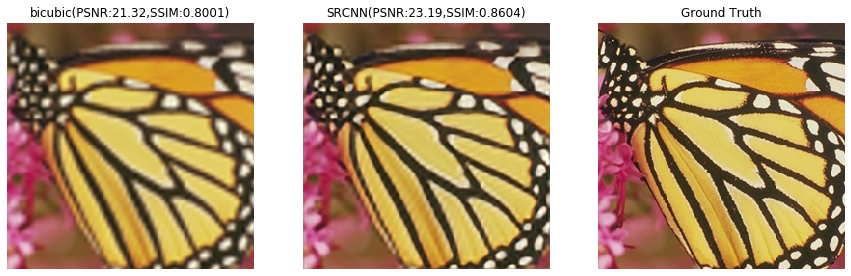

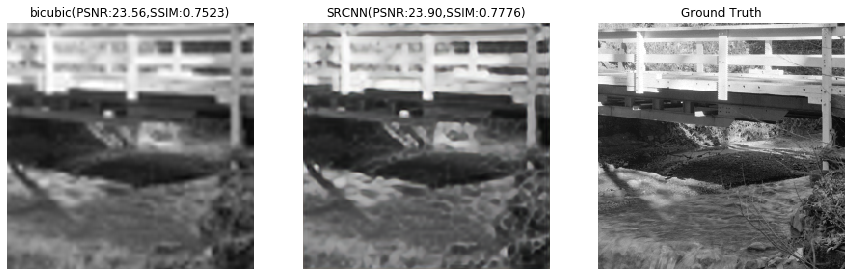

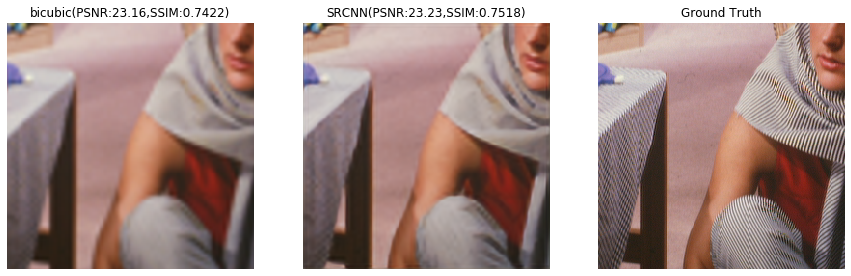

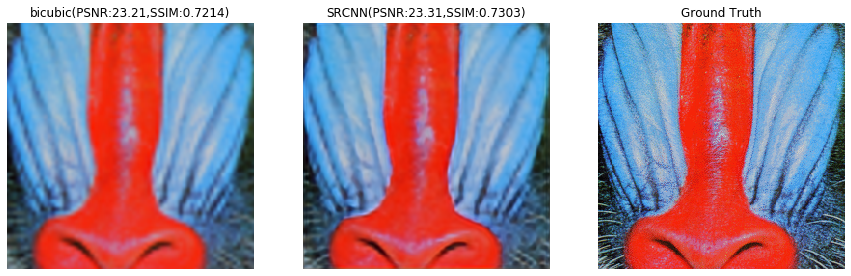

In [ ]:
sr_test(learn, il_test_x, il_test_y, model_name)
# Official: bicubic: PSNR:25.99, SSIM:0.7486
# Official: SRCNN:   PSNR:27.50, SSIM:0.7513

In [ ]:
#export
def sr_test_upscale(learn:Learner, il_x:ImageImageList, il_y:ImageImageList, il_x_up:ImageImageList, model_name:str, cmap:str=None):
    """ model で upscale する SR のテストを実施する """
    pred_metrics = []
    bicubic_metrics = []
    for x, y, z in zip(il_x, il_y, il_x_up):
        pred = sr_predict(learn, x)
        pred_metrics.append(get_metrics(image2np(y.px), image2np(pred.px)))
        bicubic_metrics.append(get_metrics(image2np(y.px), image2np(z.px)))
        fig, axs = plt.subplots(1, 3, figsize=(15, 15))
        x.show(ax=axs[0], title=f'bicubic({fmt_metrics(bicubic_metrics[-1])})',cmap=cmap)
        pred.show(ax=axs[1], title=f'{model_name}({fmt_metrics(pred_metrics[-1])})', cmap=cmap)
        y.show(ax=axs[2], title='Ground Truth', cmap=cmap)
    print('bicubic:', fmt_metrics(mean_metrics(bicubic_metrics)))
    print(f'{model_name}:\t', fmt_metrics(mean_metrics(pred_metrics)))